## Cyclone Debbie Flood Mapping- Sentinel-2 
This script lists the workflow for delineating flood inundation caused by Cyclone Debbie in March 2017 using optical imagery from Sentinel-2.
The workflow includes before and after images using Green and SWIR bands to calculate MNDWI.

### Upload packages

In [1]:
# Upload packages needed for analysis:
%matplotlib inline

import os
import datacube
from datacube.utils.masking import mask_invalid_data # reprojecting to Albers
import rioxarray #reprojecting to Albers
import odc.geo.xr #reprojecting to Albers

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
from IPython.display import Image

from skimage.filters import threshold_otsu
from sklearn.metrics import confusion_matrix, cohen_kappa_score

import numpy as np
import xarray as xr
import geopandas as gpd

import rasterio
from rasterio.transform import from_origin
from rasterio.features import rasterize

import sys
sys.path.insert(1, '../Tools/')
from dea_tools.datahandling import load_ard
from dea_tools.bandindices import calculate_indices
from dea_tools.plotting import rgb
from dea_tools.datahandling import load_reproject
from dea_tools.bandindices import calculate_indices
from dea_tools.dask import create_local_dask_cluster
from dea_tools.datahandling import load_ard
from dea_tools.plotting import display_map, xr_animation

### Connect to the datacube

In [2]:
dc = datacube.Datacube(app="GEOM7001_Project")

### Set up a dask cluster

In [3]:
create_local_dask_cluster()

/env/lib/python3.10/site-packages/distributed/node.py:187: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 39265 instead
  warnings.warn(


Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /user/s4610425@student.uq.edu.au/proxy/39265/status,
Dashboard: /user/s4610425@student.uq.edu.au/proxy/39265/status,Workers: 1
Total threads: 2,Total memory: 14.25 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:43207,Workers: 1
Dashboard: /user/s4610425@student.uq.edu.au/proxy/39265/status,Total threads: 2
Started: Just now,Total memory: 14.25 GiB
Comm: tcp://127.0.0.1:40105,Total threads: 2
Dashboard: /user/s4610425@student.uq.edu.au/proxy/43025/status,Memory: 14.25 GiB
Nanny: tcp://127.0.0.1:38771,


2025-10-17 18:59:35,855 - distributed.scheduler - WARNING - Detected different `run_spec` for key 'dataset-fd749663d4944100925bf4780054c029' between two consecutive calls to `update_graph`. This can cause failures and deadlocks down the line. Please ensure unique key names. If you are using a standard dask collections, consider releasing all the data before resubmitting another computation. More details and help can be found at https://github.com/dask/dask/issues/9888. 
Debugging information
---------------------
old task state: released
old run_spec: (<function execute_task at 0x7fbaea3f5ab0>, (Dataset <id=fd749663-d494-4100-925b-f4780054c029 product=ga_s2am_ard_3 location=s3://dea-public-data/baseline/ga_s2am_ard_3/56/KKV/2017/02/17/20170217T045852/ga_s2am_ard_3-2-1_56KKV_2017-02-17_final.odc-metadata.yaml>,), {})
new run_spec: (<function execute_task at 0x7fbaea3f5ab0>, (Dataset <id=fd749663-d494-4100-925b-f4780054c029 product=ga_s2am_ard_3 location=s3://dea-public-data/baseline/ga_

### Load data from datacube with parameters

In [4]:
# Define the spatial and temporal extent:
lon_range = (150.41, 150.55)
lat_range = (-23.29, -23.45)
before_date = "2017-02-17"
after_date   = "2017-04-08"

# Create a query which includes bounding box, resolution, time, and crs:
query = {
    "x": lon_range,
    "y": lat_range,
    "resolution": (-20, 20), # to align with SAR and to account for SWIR 2 band
    "time": (before_date, after_date),
    "output_crs": "EPSG:3577", # Reproject to Australian Albers
    "dask_chunks": {"time": 1, "x": 512, "y": 512},  # To speed up analysis and use less memory
}

# Load Sentinel-2A with 's2cloudless' cloud masking:
ds = load_ard(
    dc=dc,
    products=["ga_s2am_ard_3"],
    measurements=["nbart_swir_2", "nbart_nir_1", "nbart_red", "nbart_green", "nbart_blue", "oa_s2cloudless_prob"],
    cloud_mask="s2cloudless", # cloud mask
    min_gooddata=0.9,  # only keep pixels where 90% of the time step is cloud-free
    group_by="solar_day",
    **query
)

Finding datasets
    ga_s2am_ard_3
Counting good quality pixels for each time step using s2cloudless


/env/lib/python3.10/site-packages/rasterio/warp.py:387: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dest = _reproject(


Filtering to 2 out of 6 time steps with at least 90.0% good quality pixels
Applying s2cloudless pixel quality/cloud mask
Returning 2 time steps as a dask array


### Check data for correct projection, alignment and extent

In [5]:
# Check data
print(ds)

# 2 time steps and a shape of 989 x 831

<xarray.Dataset> Size: 39MB
Dimensions:              (time: 2, y: 989, x: 831)
Coordinates:
  * time                 (time) datetime64[ns] 16B 2017-02-17T00:12:07.463000...
  * y                    (y) float64 8kB -2.645e+06 -2.645e+06 ... -2.665e+06
  * x                    (x) float64 7kB 1.856e+06 1.856e+06 ... 1.872e+06
    spatial_ref          int32 4B 3577
Data variables:
    nbart_swir_2         (time, y, x) float32 7MB dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    nbart_nir_1          (time, y, x) float32 7MB dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    nbart_red            (time, y, x) float32 7MB dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    nbart_green          (time, y, x) float32 7MB dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    nbart_blue           (time, y, x) float32 7MB dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
    oa_s2cloudless_prob  (time, y, x) float32 7MB dask.array<chunksize=(1, 512, 512), meta=np.ndarray>
A

### Visualise RGB Before and After

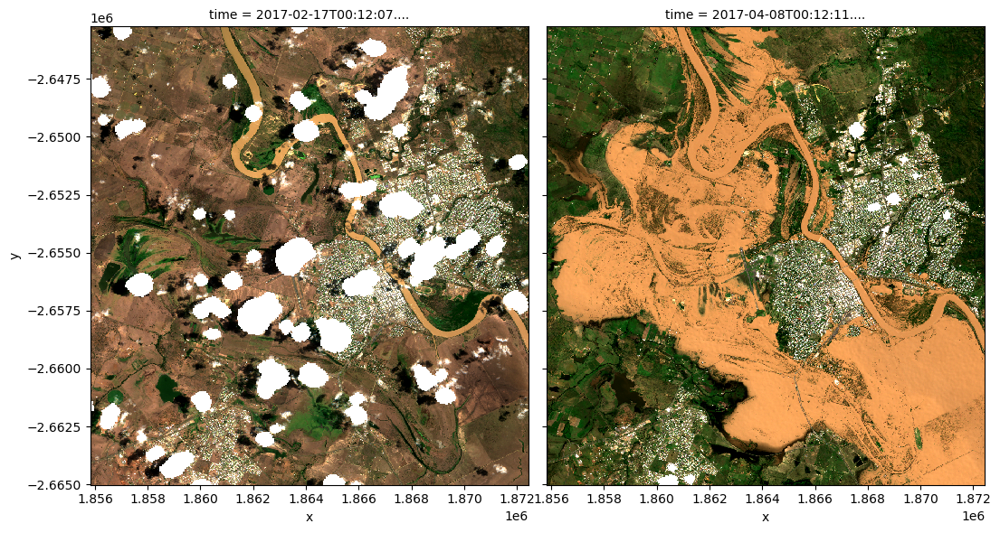

In [6]:
# Initial look at RGB images - before and after
rgb(ds, bands=["nbart_red","nbart_green","nbart_blue"], col="time", col_wrap=3, robust=True)

/tmp/ipykernel_556/2526396713.py:5: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  width = ds.dims["x"]
/tmp/ipykernel_556/2526396713.py:6: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  height = ds.dims["y"]
/tmp/ipykernel_556/2526396713.py:14: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  n_time = ds.dims["time"] # want to map the two time steps in the xarray (before and after cyclone):


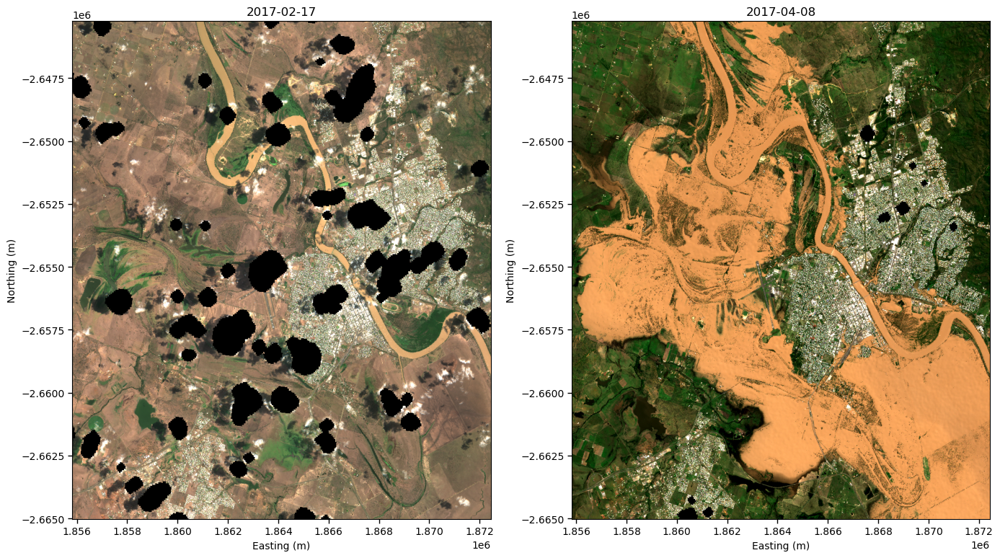

In [12]:
# Fit a plot that aligns with SAR images (i.e., same size, extent):

# Calculate the default transform for reprojection - ensures raster aligns with real-world coordinates (Australian Albers):
transform = ds.odc.transform  # works for DEA/ODC datasets
width = ds.dims["x"]
height = ds.dims["y"]
x_min = transform.c
y_max = transform.f
x_max = x_min + transform.a * width
y_min = y_max + transform.e * height  # transform.e is negative
extent = [x_min, x_max, y_min, y_max]

# Create the plot:
n_time = ds.dims["time"] # want to map the two time steps in the xarray (before and after cyclone):
fig, axes = plt.subplots(1, n_time, figsize=(14, 12)) # create plot parameters
if n_time == 1:
    axes = [axes] # wraps the single axes in a list for plotting
    
for i, ax in enumerate(axes):
    # Extract RGB bands
    red   = ds['nbart_red'].isel(time=i).compute().values # red band 
    green = ds['nbart_green'].isel(time=i).compute().values # green band
    blue  = ds['nbart_blue'].isel(time=i).compute().values # blue band

    # Replace NaNs with zero for plotting (i.e., clouds that were masked when reading in data earlier)
    red[np.isnan(red)] = 0
    green[np.isnan(green)] = 0
    blue[np.isnan(blue)] = 0
    rgb = np.stack([red, green, blue], axis=-1) # make cloud mask black

    # Add a percentile stretch to improve visual clarity:
    p2, p98 = np.percentile(rgb, (2, 98))
    rgb_norm = np.clip((rgb - p2) / (p98 - p2), 0, 1)

    ax.imshow(rgb_norm, origin="upper", extent=extent)
    ax.set_xlabel("Easting (m)")
    ax.set_ylabel("Northing (m)")
    ax.set_title(str(ds.time.values[i])[:10])
    ax.tick_params(direction='out', length=4, width=1)

plt.tight_layout()
# output_path = "rgb_georef_labels.png"
# fig.savefig(output_path, dpi=300, bbox_inches='tight')
# plt.show()

### Calculate MNDWI Index

In [13]:
# Calculate MNDWI and add it to the loaded data set:
ds['mndwi'] = (ds.nbart_green - ds.nbart_swir_2) / (ds.nbart_green + ds.nbart_swir_2)

# Check that MNDWI has been added to dataset:
print(ds['mndwi'])

<xarray.DataArray 'mndwi' (time: 2, y: 989, x: 831)> Size: 7MB
dask.array<truediv, shape=(2, 989, 831), dtype=float32, chunksize=(1, 512, 512), chunktype=numpy.ndarray>
Coordinates:
  * time         (time) datetime64[ns] 16B 2017-02-17T00:12:07.463000 2017-04...
  * y            (y) float64 8kB -2.645e+06 -2.645e+06 ... -2.665e+06 -2.665e+06
  * x            (x) float64 7kB 1.856e+06 1.856e+06 ... 1.872e+06 1.872e+06
    spatial_ref  int32 4B 3577


### Subset MNDWI into Before and After Images

In [14]:
# Select time steps from ds['mndwi']
mndwi_before = ds['mndwi'].sel(time="2017-02-17T00:12:07.463000000")
mndwi_after  = ds['mndwi'].sel(time="2017-04-08T00:12:11.463000000")

# Compute dask arrays to load numpy arrays into memory:
mndwi_before = mndwi_before.compute()
mndwi_after  = mndwi_after.compute()

### Write 'After' MNDWI to disc for validation later 

In [16]:
# Get coordinates from the original dataset
x = ds.x.values
y = ds.y.values
arr = mndwi_after.astype('float32')
# Calculate pixel size:
pixel_width  = x[1] - x[0]
pixel_height = y[0] - y[1]

# Create affine transform to match with crs:
transform = from_origin(x.min(), y.max(), pixel_width, abs(pixel_height))

# Define crs again (Australian Albers)
crs = f"EPSG:{ds.spatial_ref.values}"

# Write to folder as a geotiff:
out_path = "mndwi_after.tif"
with rasterio.open(
    out_path,
    'w',
    driver='GTiff',
    height=arr.shape[0],
    width=arr.shape[1],
    count=1,
    dtype=arr.dtype,
    crs=crs,
    transform=transform,
) as dst:
    dst.write(arr, 1)

### Check projection, shape and resolution of MNDWI GeoTiff

In [18]:
with rasterio.open("mndwi_after.tif") as src:
    print("CRS:", src.crs) # shows crs - Albers         
    print("Transform:", src.transform) # shows coordinate system and resolution
    print("Width:", src.width)          
    print("Height:", src.height)         
    print("Number of bands:", src.count) 

CRS: EPSG:3577
Transform: | 20.00, 0.00, 1855830.00|
| 0.00,-20.00,-2645250.00|
| 0.00, 0.00, 1.00|
Width: 831
Height: 989
Number of bands: 1


### Plot MNDWI Before and After

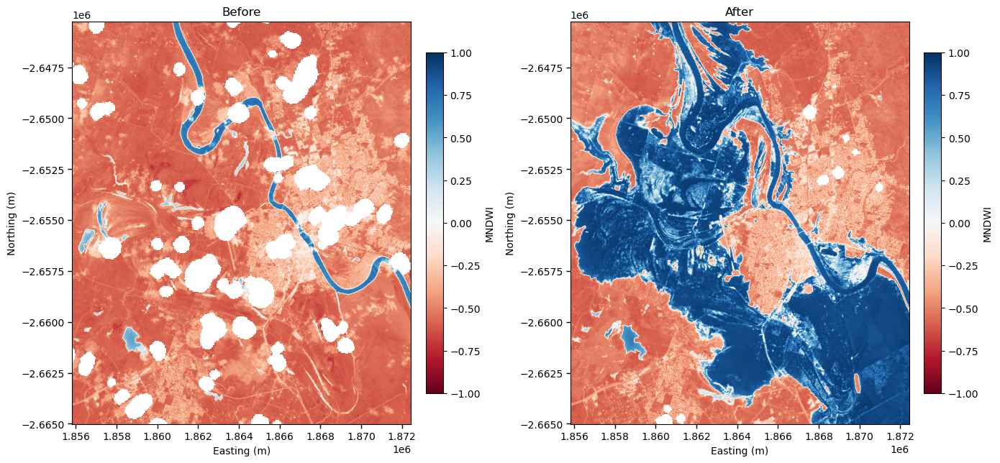

In [22]:
# Select before and after dates
before_date_ds = ds.isel(time=0)
after_date_ds  = ds.isel(time=-1)

# Set plotting parameters:
fig, axes = plt.subplots(1, 2, figsize=(14, 12))

# MNDWI Before:
m_before = axes[0].imshow(
    before_date_ds['mndwi'],
    cmap='RdBu',
    vmin=-1, vmax=1,
    origin='upper',
    extent=extent
)
axes[0].set_title("Before")
axes[0].set_xlabel("Easting (m)")
axes[0].set_ylabel("Northing (m)")
axes[0].tick_params(direction='out', length=4, width=1)

cbar1 = fig.colorbar(m_before, ax=axes[0], fraction=0.046, pad=0.04)
cbar1.set_label("MNDWI")

# MNDWI After:
m_after = axes[1].imshow(
    after_date_ds['mndwi'],
    cmap='RdBu',
    vmin=-1, vmax=1,
    origin='upper',
    extent=extent
)
# Set axis labels, title and tick parameters:
axes[1].set_title("After")
axes[1].set_xlabel("Easting (m)")
axes[1].set_ylabel("Northing (m)")
axes[1].tick_params(direction='out', length=4, width=1)

# Add colourbar:
cbar2 = fig.colorbar(m_after, ax=axes[1], fraction=0.046, pad=0.04)
cbar2.set_label("MNDWI")

plt.tight_layout()
# output_path = "mndwi_before_after_georef.png"
# fig.savefig(output_path, dpi=300, bbox_inches='tight')
plt.show()

### Apply Otsu threshold

In [24]:
# Subset MNDWI by before and after:
mndwi_before = ds['mndwi'].isel(time=0).values
mndwi_after  = ds['mndwi'].isel(time=-1).values

# Flatten to single array and remove NaNs:
pixels_before = mndwi_before[~np.isnan(mndwi_before)].flatten()
pixels_after  = mndwi_after[~np.isnan(mndwi_after)].flatten()
# Stack both arrays:
all_pixels = np.concatenate([pixels_before, pixels_after])

# Compute a single Otsu threshold:
otsu_threshold = threshold_otsu(all_pixels)
print("Otsu threshold (same for both):", otsu_threshold)

Otsu threshold (same for both): 0.13899967


In [25]:
# Threshold for binarising water and non-water for Sentinel-2:
# otsu_threshold = 0.13875246 # 10 res
otsu_threshold = 0.13899967 # 20m res

### Defining water and non-water from Otsu thresholds for MNDWI

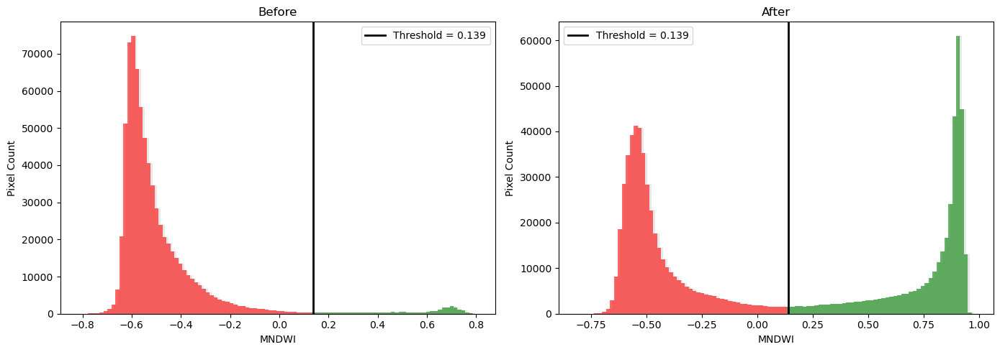

In [26]:
# --- Function to plot histogram with shaded areas ---
def plot_histogram_shaded(pixels, threshold, ax, title, water_color='green', non_water_color='red'):
    # Histogram
    counts, bins, _ = ax.hist(pixels, bins=100, color='lightgray', alpha=0.5)
    
    # Shade non-water
    ax.bar(bins[:-1][bins[:-1] <= threshold],
           counts[bins[:-1] <= threshold],
           width=bins[1] - bins[0],
           color=non_water_color,
           alpha=0.6)
    
    # Shade water
    ax.bar(bins[:-1][bins[:-1] > threshold],
           counts[bins[:-1] > threshold],
           width=bins[1] - bins[0],
           color=water_color,
           alpha=0.6)
    
    # Threshold line
    ax.axvline(threshold, color='black', linewidth=2, label=f"Threshold = {threshold:.3f}")
    
    ax.set_title(title)
    ax.set_xlabel("MNDWI")
    ax.set_ylabel("Pixel Count")
    ax.legend()

# --- Plot before and after ---
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
plot_histogram_shaded(pixels_before, otsu_threshold, axes[0], "Before")
plot_histogram_shaded(pixels_after, otsu_threshold, axes[1], "After")

plt.tight_layout()

# --- Export ---
output_path = "mndwi_histograms.png"   # or .pdf, .jpg, .svg
fig.savefig(output_path, dpi=300, bbox_inches='tight')

plt.show()


### Build and apply classifier

In [15]:
def create_water_mask_mndwi(mndwi_array, threshold):
    """
    Returns a binary water mask from MNDWI values.
    1 = water
    0 = non-water
    NaN pixels remain NaN.
    """
    mask = np.zeros_like(mndwi_array, dtype=np.uint8)
    mask[(mndwi_array > threshold) & np.isfinite(mndwi_array)] = 1
    return mask

# Apply to before and after dates
water_before_mask = create_water_mask_mndwi(ds['mndwi'].isel(time=0).values, otsu_threshold)
water_after_mask  = create_water_mask_mndwi(ds['mndwi'].isel(time=-1).values, otsu_threshold)

# Check Classifiers
print("Printed array of water_before_mask: ", water_before_mask)
print("Printed array of water_after_mask: ", water_after_mask)

Printed array of water_before_mask:  [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
Printed array of water_after_mask:  [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]
 [0 0 0 ... 1 1 1]]


### Visualise flood delineation - binary maps
0 = Non-water  
1 = Water

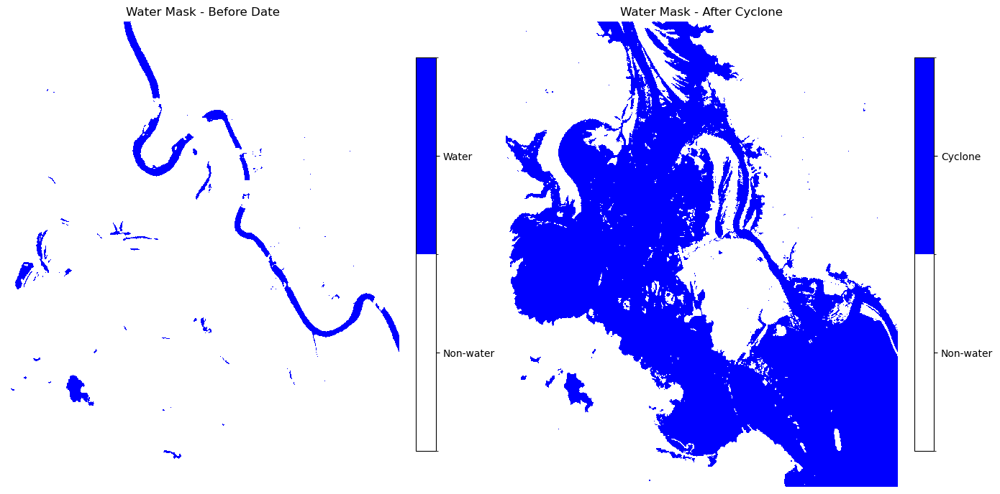

In [16]:
# Define binary colourmap: 0 = white (non-water), 1 = blue (water)
cmap = mcolors.ListedColormap(['white', 'blue'])
bounds = [0, 0.5, 1]  # define boundaries for the two values
norm = mcolors.BoundaryNorm(bounds, cmap.N)

fig, axes = plt.subplots(1, 2, figsize=(14, 12))

# --- Before Water Mask ---
im0 = axes[0].imshow(water_before_mask, cmap=cmap, norm=norm)
axes[0].set_title("Water Mask - Before Date")
axes[0].axis("off")
cbar0 = fig.colorbar(im0, ax=axes[0], ticks=[0.25, 0.75], fraction=0.046, pad=0.04)
cbar0.ax.set_yticklabels(['Non-water', 'Water'])

# --- After Water Mask ---
im1 = axes[1].imshow(water_after_mask, cmap=cmap, norm=norm)
axes[1].set_title("Water Mask - After Cyclone")
axes[1].axis("off")
cbar1 = fig.colorbar(im1, ax=axes[1], ticks=[0.25, 0.75], fraction=0.046, pad=0.04)
cbar1.ax.set_yticklabels(['Non-water', 'Cyclone'])

plt.tight_layout()
plt.show()


### Create flood map with both Before & After Cyclone water extent

/tmp/ipykernel_219/2812990866.py:23: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  width = ds.dims["x"]
/tmp/ipykernel_219/2812990866.py:24: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  height = ds.dims["y"]


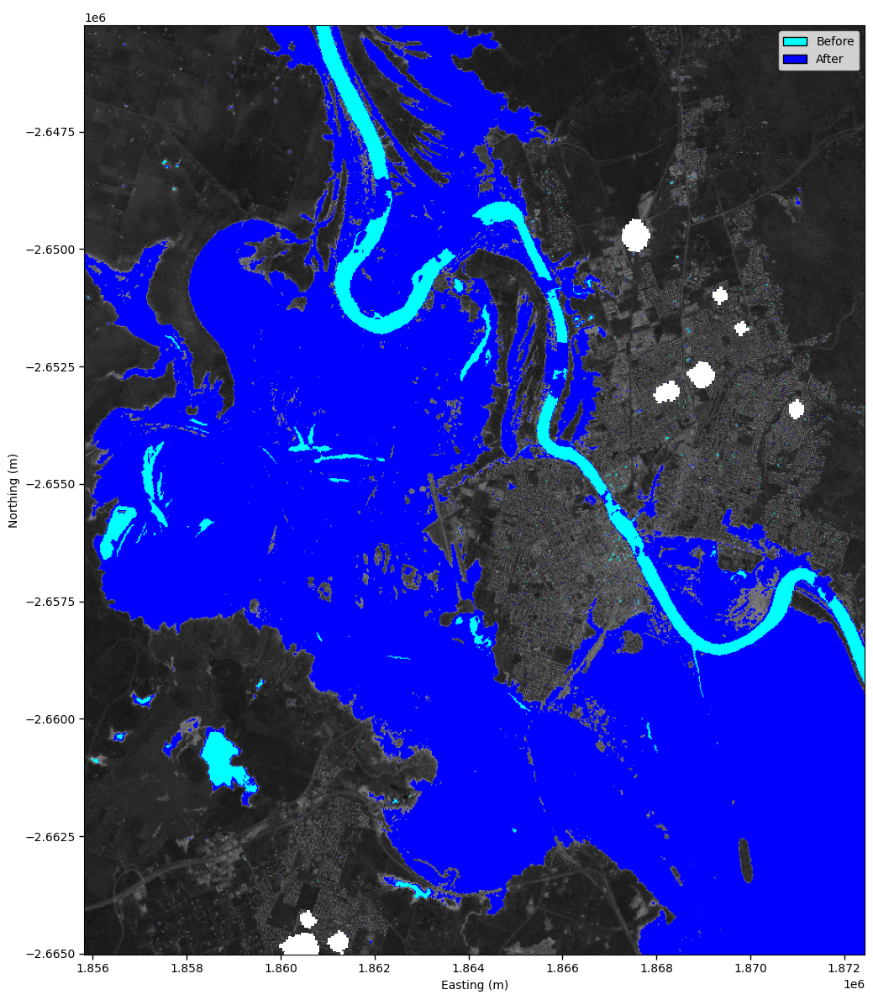

In [17]:
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import numpy as np

# --- Determine newly appeared water ---
new_water_mask = (water_after_mask == 1) & (water_before_mask == 0)

# --- Create grayscale RGB background from after-date MNDWI ---
rgb = np.stack([mndwi_after, mndwi_after, mndwi_after], axis=-1)

# --- Normalize ---
rgb_min, rgb_max = np.nanmin(rgb), np.nanmax(rgb)
rgb = (rgb - rgb_min) / (rgb_max - rgb_min)

# --- Highlight existing water in cyan ---
rgb[(water_before_mask == 1) & (new_water_mask == 0)] = [0, 1, 1]  # cyan

# --- Highlight newly appeared water in blue ---
rgb[new_water_mask] = [0, 0, 1]  # blue

# --- Get georeferenced extent from transform ---
transform = ds.odc.transform  # if using DEA/ODC dataset
width = ds.dims["x"]
height = ds.dims["y"]

x_min = transform.c
y_max = transform.f
x_max = x_min + transform.a * width
y_min = y_max + transform.e * height
extent = [x_min, x_max, y_min, y_max]

# --- Plot ---
fig, ax = plt.subplots(figsize=(14, 12))
im = ax.imshow(rgb, origin='upper', extent=extent)

ax.set_title("  ")
ax.set_xlabel("Easting (m)")
ax.set_ylabel("Northing (m)")

# Keep ticks (graticules), no gridlines
ax.tick_params(direction='out', length=4, width=1)

# --- Legend ---
legend_elements = [
    Patch(facecolor='cyan', edgecolor='k', label='Before'),
    Patch(facecolor='blue', edgecolor='k', label='After')
]
ax.legend(handles=legend_elements, loc='upper right')

plt.tight_layout()

# --- Export ---
# output_path = "binary_flood_map.png"
# fig.savefig(output_path, dpi=300, bbox_inches='tight')
plt.show()


## Validation Section

### Write in QLD Gov Cyclone Debbie Flood Shapefile
Dataset derived from: insert webpage, metadata here.
- Reproject to Australian Albers
- Resample to 20m resolution
- Crop to study extent

In [18]:
# 1. Define folder containing the shapefile
extract_folder = "Flood_extent_polygon_GDA94"

# 2. Build full path to the shapefile
shp_path = os.path.join(extract_folder, "Flood_extent_polygon_GDA94.shp")

# 3. Load shapefile and reproject to match MNDWI CRS (EPSG:3577)
flood_gdf = gpd.read_file(shp_path).to_crs(epsg=3577)

# 4. Open reference MNDWI raster to get metadata, shape, and transform
ref_raster_path = "mndwi_after.tif"
with rasterio.open(ref_raster_path) as ref_src:
    ref_meta = ref_src.meta.copy()    # metadata to reuse
    ref_shape = ref_src.shape         # (height, width)
    ref_transform = ref_src.transform # affine transform

# 5. Rasterize the flood shapefile to match reference raster
flood_raster = rasterize(
    [(geom, 1) for geom in flood_gdf.geometry],  # assign 1 to flooded pixels
    out_shape=ref_shape,                         # match raster size
    transform=ref_transform,                     # match raster location & resolution
    fill=0,                                      # background value for non-flood
    dtype="uint8"
)

# # 6. Save the rasterized flood extent to disk
# out_raster_path = "flood_extent_rasterized.tif"
# ref_meta.update(dtype="uint8", count=1)
# with rasterio.open(out_raster_path, "w", **ref_meta) as dst:
#     dst.write(flood_raster, 1)

# print(f"Rasterized flood extent saved to: {out_raster_path}")


### Check MNDWI flood classification and reference dataset have the same shape

In [19]:
print("Flood raster shape:", flood_raster.shape)

# Open the MNDWI raster to get its shape
import rasterio

with rasterio.open("mndwi_after.tif") as src:
    mndwi_shape = src.read(1).shape  # read first band to get shape

print("MNDWI raster shape:", mndwi_shape)

# Quick check if shapes match
if flood_raster.shape == mndwi_shape:
    print("Flood raster and MNDWI raster have the same shape — ready for analysis.")
else:
    print("Shape mismatch! You need to align or resample arrays first.")


Flood raster shape: (989, 831)
MNDWI raster shape: (989, 831)
Flood raster and MNDWI raster have the same shape — ready for analysis.


### Compare MNDWI flood classification to QLD Gov reference dataset
Produce a confusion matrix with:  
- Overall accuracy
- Kappa
- Producer Accuracy
- User Accuracy

In [20]:
# Calculate accuracy metrics
def accuracy_metrics(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred, labels=[0,1])
    TN, FP, FN, TP = cm.ravel()
    overall_acc = (TP + TN) / (TP + TN + FP + FN)
    kappa = cohen_kappa_score(y_true, y_pred)
    producer_acc = [TN/(TN+FP), TP/(TP+FN)]  # [Non-flood, Flood]
    user_acc = [TN/(TN+FN), TP/(TP+FP)]      # [Non-flood, Flood]
    return {
        "Confusion Matrix": cm,
        "Overall Accuracy": overall_acc,
        "Kappa": kappa,
        "Producer Accuracy": producer_acc,
        "User Accuracy": user_acc
    }

# Flatten arrays for comparison
y_true = flood_raster.ravel()       # rasterized ground truth
y_pred = water_after_mask.ravel()   # binary MNDWI-based classification

# Accuracy Assessment
metrics = accuracy_metrics(y_true, y_pred)
print("=== MNDWI Flood Classification Accuracy ===")
print("Confusion Matrix:\n", metrics["Confusion Matrix"])
print(f"Overall Accuracy: {metrics['Overall Accuracy']:.3f}")
print(f"Kappa: {metrics['Kappa']:.3f}")
print(f"Producer Accuracy [Non-flood, Flood]: {metrics['Producer Accuracy']}")
print(f"User Accuracy [Non-flood, Flood]: {metrics['User Accuracy']}")


=== MNDWI Flood Classification Accuracy ===
Confusion Matrix:
 [[422376   1981]
 [ 44774 352728]]
Overall Accuracy: 0.943
Kappa: 0.886
Producer Accuracy [Non-flood, Flood]: [0.995331760758041, 0.8873615730235319]
User Accuracy [Non-flood, Flood]: [0.9041549823397196, 0.9944151402981035]


### Overlay QLD Gov flood dataset on MNDWI flood map

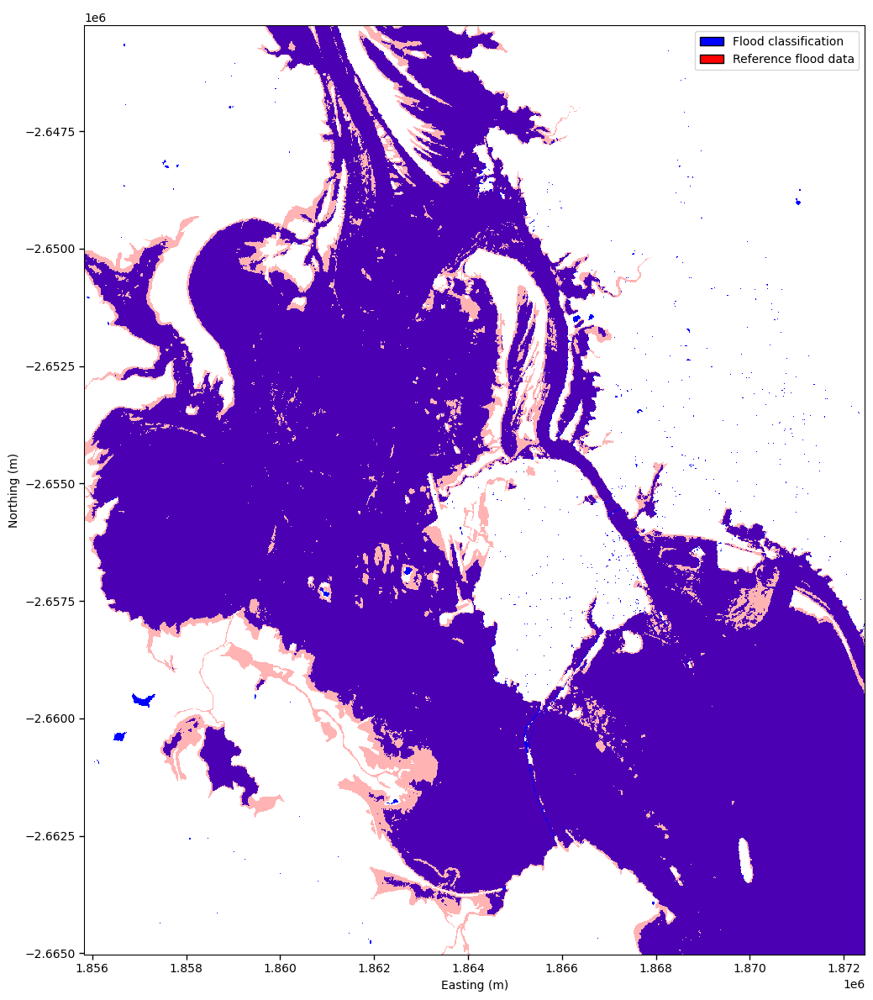

In [21]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.patches import Patch

# --- Binary colormap for MNDWI water mask ---
mndwi_cmap = mcolors.ListedColormap(['white', 'blue'])
mndwi_norm = mcolors.BoundaryNorm([0, 0.5, 1], mndwi_cmap.N)

# --- Red overlay for reference flood ---
ref_cmap = mcolors.ListedColormap(['none', 'red'])  # red for flood
ref_alpha = 0.3

# --- Define extent from reference raster (flood_raster) ---
extent = [
    ref_transform[2],                                          # left (x_min)
    ref_transform[2] + ref_transform[0] * flood_raster.shape[1],  # right (x_max)
    ref_transform[5] + ref_transform[4] * flood_raster.shape[0],  # bottom (y_min)
    ref_transform[5]                                            # top (y_max)
]

# --- Plot ---
fig, ax = plt.subplots(1, 1, figsize=(14, 12))

# Show MNDWI classification water mask
im = ax.imshow(
    water_after_mask,
    cmap=mndwi_cmap,
    norm=mndwi_norm,
    extent=extent,
    origin='upper'
)

# Overlay reference flood raster (QLD Gov flood dataset)
ax.imshow(
    flood_raster,
    cmap=ref_cmap,
    alpha=ref_alpha,
    extent=extent,
    origin='upper'
)

# --- Axis labels and ticks (georeferenced) ---
ax.set_title("  ")
ax.set_xlabel("Easting (m)")
ax.set_ylabel("Northing (m)")
ax.tick_params(direction='out', length=4, width=1)


# --- Optional Legend for overlay ---
# Legend with solid red (fully opaque) for reference flood
legend_elements = [
    Patch(facecolor='blue', edgecolor='k', label='Flood classification'),
    Patch(facecolor=(1, 0, 0), edgecolor='k', label='Reference flood data')  # RGB tuple for solid red
]
ax.legend(handles=legend_elements, loc='upper right')


plt.tight_layout()

# --- Export ---
output_path = "s2_vs_reference_flood.png"
fig.savefig(output_path, dpi=300, bbox_inches='tight')
plt.show()


### Calculate area of flood inundation - Before and After Cyclone

In [23]:
# Determine pixel area:
# Pixel size from reference raster transform
pixel_width = ref_transform[0]  # typically negative in y, positive in x
pixel_height = abs(ref_transform[4])
pixel_area_m2 = pixel_width * pixel_height

# count flooded pixels:
flooded_pixels_before = np.sum(water_before_mask == 1)
flooded_pixels_after = np.sum(water_after_mask == 1)
flooded_pixels_ref = np.sum(flood_raster == 1) # reference data

# Area in m²
flood_area_m2_before = flooded_pixels_before * pixel_area_m2
flood_area_m2_after = flooded_pixels_after * pixel_area_m2
flood_area_m2_ref = flooded_pixels_ref * pixel_area_m2

# Area in km²
flood_area_km2_before = flood_area_m2_before / 1_000_000
flood_area_km2_after = flood_area_m2_after / 1_000_000
flood_area_km2_ref = flood_area_m2_ref / 1_000_000

# Convert to hectares
flood_area_ha_before = flood_area_m2_before / 10000
flood_area_ha_after = flood_area_m2_after / 10000
flood_area_ha_ref = flood_area_m2_ref / 10000  

# Convert to acres
flood_area_acres_before = flood_area_m2_before / 4046.856
flood_area_acres_after = flood_area_m2_after / 4046.856
flood_area_acres_ref = flood_area_m2_ref / 4046.856

# --- Print results ---
print(f"Water Area BEFORE cyclone: {flood_area_km2_before:.2f} km² / "
      f"{flood_area_ha_before:.2f} ha / {flood_area_acres_before:.2f} acres")

print(f"Water Area AFTER cyclone: {flood_area_km2_after:.2f} km² / "
      f"{flood_area_ha_after:.2f} ha / {flood_area_acres_after:.2f} acres")
print(f"Flood reference data: "
      f"{flood_area_km2_ref:.2f} km² / "
      f"{flood_area_ha_ref:.2f} ha / "
      f"{flood_area_acres_ref:.2f} acres")

Water Area BEFORE cyclone: 9.33 km² / 933.36 ha / 2306.38 acres
Water Area AFTER cyclone: 141.88 km² / 14188.36 ha / 35060.20 acres
Flood reference data: 159.00 km² / 15900.08 ha / 39289.96 acres


## Variables for Geographic Weighted Logistic Regression Model

### Import Fitzroy River Edge Shapefile from ArcGIS REST Server

In [22]:
import requests
import geopandas as gpd
import rasterio
from rasterio.features import rasterize
from rasterio.warp import reproject, Resampling
import numpy as np


# Download Fitzroy river edge with filters
url = "https://spatial-gis.information.qld.gov.au/arcgis/rest/services/InlandWaters/WaterCoursesAndBodies/MapServer/35/query"
where = "feature_type = 'Shoreline' AND hierarchy = 'Major' AND perenniality = 'Perennial'"
params = {"where": where, "outFields": "*", "f": "geojson", "returnGeometry": "true"}

r = requests.get(url, params=params)
r.raise_for_status()
gdf = gpd.GeoDataFrame.from_features(r.json()["features"], crs="EPSG:4283")

# -----------------------------
# Reproject to Australian Albers
# -----------------------------
river = gdf.to_crs(epsg=3577)


# Open reference flood raster for alignment - cropping to extent and resampling to 20m
flood_raster = rasterio.open("mndwi_after.tif")
study_extent = flood_raster.bounds  # use flood raster extent
# Rasterize river over study extent at original resolution
width = flood_raster.width
height = flood_raster.height
transform = flood_raster.transform

river_raster = rasterize(
    [(geom, 1) for geom in river.geometry],
    out_shape=(height, width),
    transform=transform,
    all_touched=True,
    fill=0,
    dtype=np.uint8
)

print("River edge upload successful")

River edge upload successful


### Calculate Distance from River edge & visualise

Distance raster shape: (989, 831)
Max distance (m): 14303.146506975309


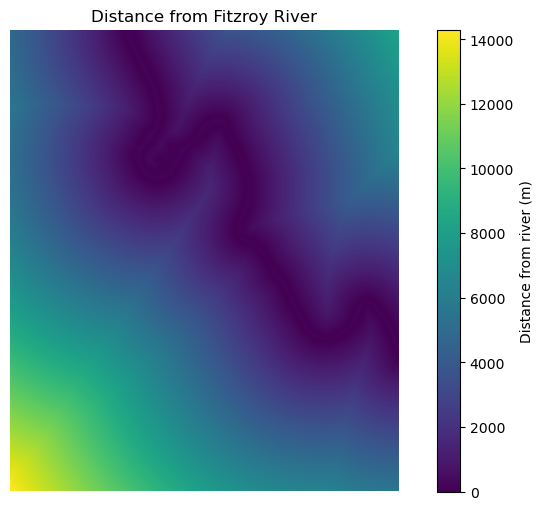

In [23]:
from scipy.ndimage import distance_transform_edt

# Compute distance-from-river raster in meters
# 1 - river_raster flips 1/0 so distance is measured from river edge
distance_from_river = distance_transform_edt(1 - river_raster) * flood_raster.res[0]

print("Distance raster shape:", distance_from_river.shape)
print("Max distance (m):", distance_from_river.max())

# Visualise
import matplotlib.pyplot as plt

# Plot distance-from-river raster
plt.figure(figsize=(10, 6)) # change to 14, 12 when exporting
plt.imshow(distance_from_river, cmap='viridis')
plt.colorbar(label='Distance from river (m)')
plt.title('Distance from Fitzroy River')
plt.axis('off')
plt.show()


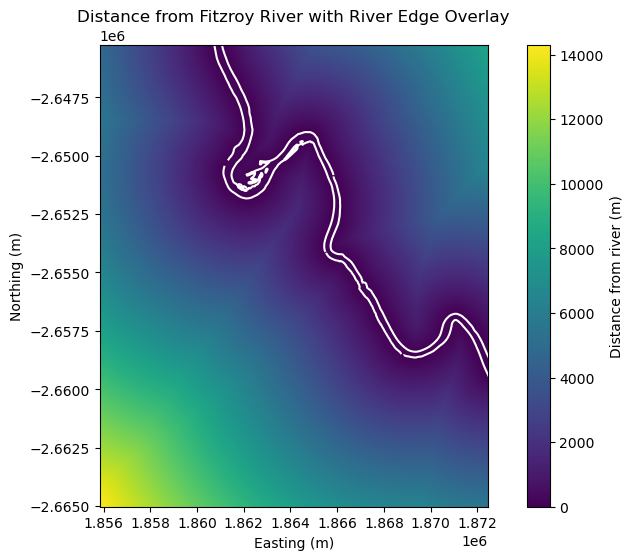

In [24]:
# Plot distance raster with river overlay - NO CONTOURS
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt

# Create coordinates from flood_raster transform
height = flood_raster.height
width = flood_raster.width
transform = flood_raster.transform

x = np.arange(width) * transform.a + transform.c + transform.a / 2
y = np.arange(height) * transform.e + transform.f + transform.e / 2

distance_da = xr.DataArray(distance_from_river, dims=("y", "x"), coords={"x": x, "y": y})

# Plot
fig, ax = plt.subplots(figsize=(10, 6))
distance_da.plot(ax=ax, cmap="viridis", add_colorbar=True, cbar_kwargs={"label": "Distance from river (m)"})

# Overlay river
river.plot(ax=ax, color='white', linewidth=1.5)

ax.set_title("Distance from Fitzroy River with River Edge Overlay")
ax.set_xlabel("Easting (m)")
ax.set_ylabel("Northing (m)")
plt.show()


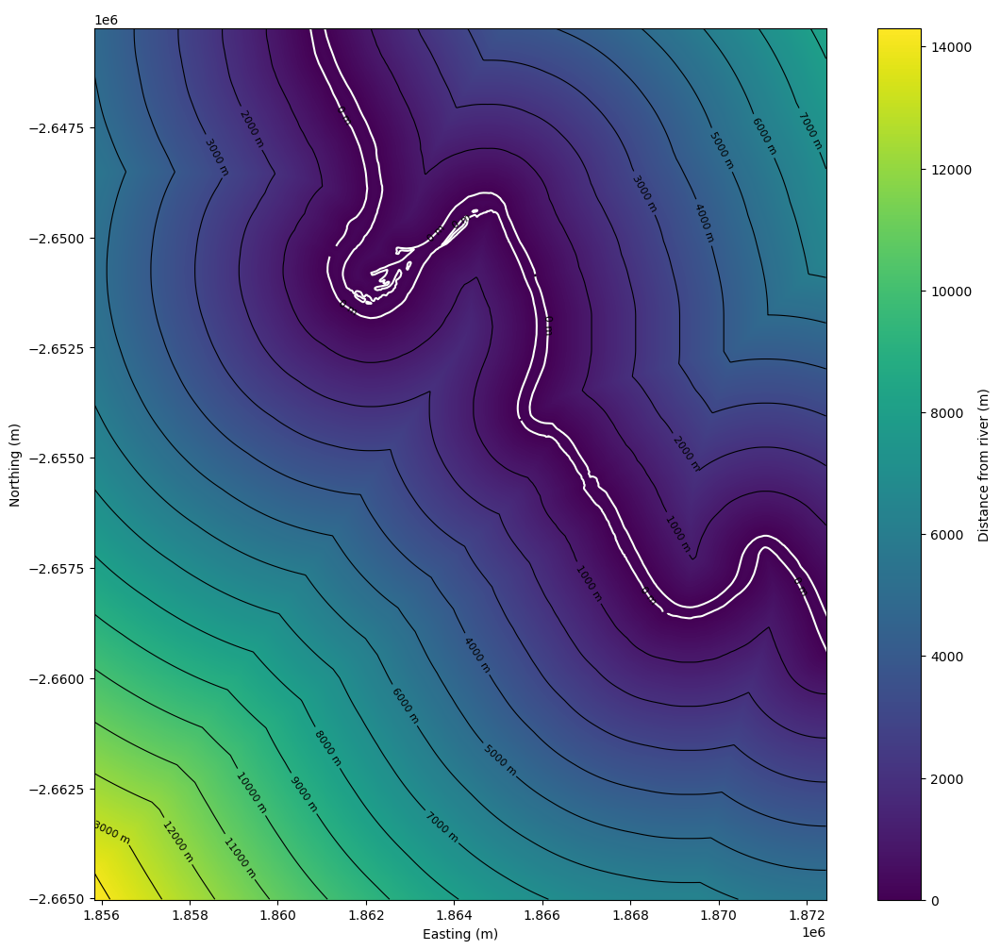

In [27]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt

# --- Create coordinates from flood_raster transform ---
height = flood_raster.height
width = flood_raster.width
transform = flood_raster.transform

x = np.arange(width) * transform.a + transform.c + transform.a / 2
y = np.arange(height) * transform.e + transform.f + transform.e / 2

# Create DataArray
distance_da = xr.DataArray(
    distance_from_river,
    dims=("y", "x"),
    coords={"x": x, "y": y}
)

# --- Contour levels (every 1000 m) ---
contour_levels = np.arange(0, np.nanmax(distance_from_river) + 1000, 1000)

# --- Plot ---
fig, ax = plt.subplots(figsize=(14, 12))

# Raster
distance_da.plot(
    ax=ax,
    cmap="viridis",
    add_colorbar=True,
    cbar_kwargs={"label": "Distance from river (m)"}
)

# Contours
X, Y = np.meshgrid(x, y)
cs = ax.contour(
    X, Y, distance_from_river,
    levels=contour_levels,
    colors='black',
    linewidths=0.8
)
ax.clabel(cs, inline=True, fontsize=8, fmt="%d m")

# Overlay river
river.plot(ax=ax, color='white', linewidth=1.5)

ax.set_title("  ")
ax.set_xlabel("Easting (m)")
ax.set_ylabel("Northing (m)")
plt.show()


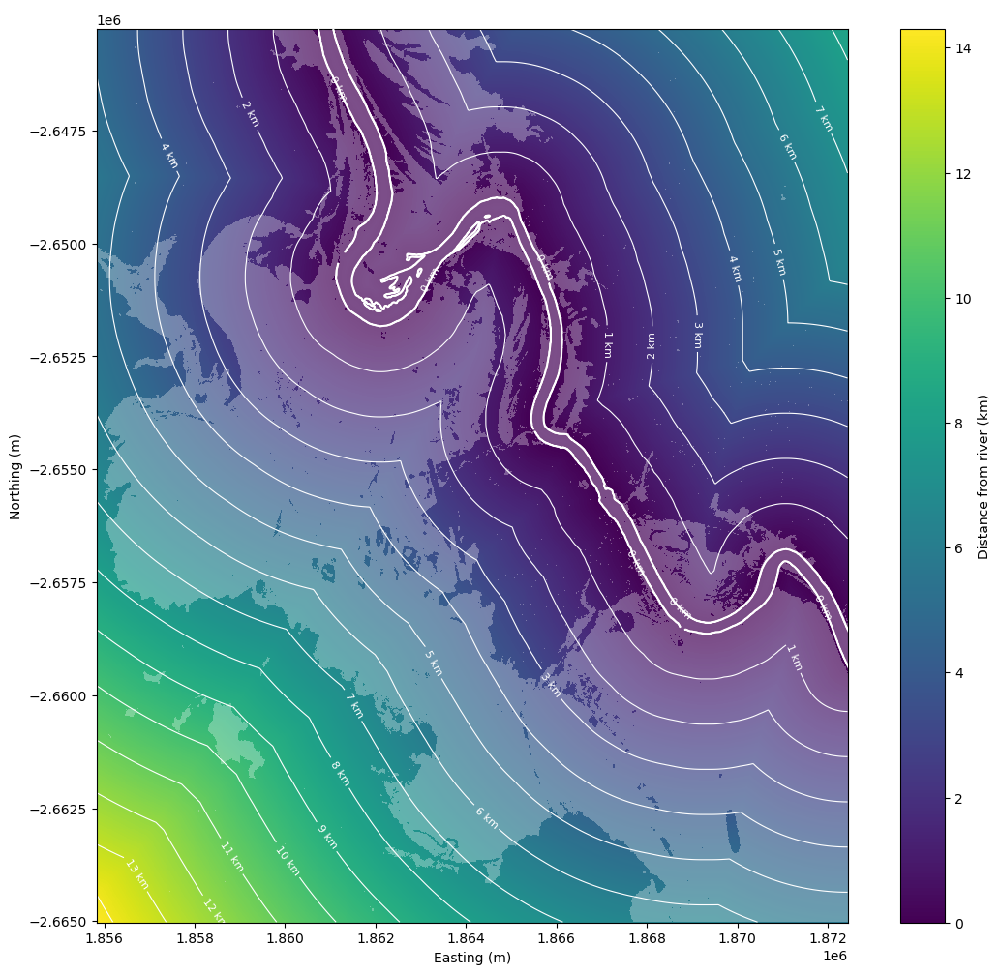

In [69]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# --- Create coordinates from flood_raster transform ---
height = flood_raster.height
width = flood_raster.width
transform = flood_raster.transform

x = np.arange(width) * transform.a + transform.c + transform.a / 2
y = np.arange(height) * transform.e + transform.f + transform.e / 2

# Convert distance to kilometers
distance_km = distance_from_river / 1000.0

# If y is descending, flip both y and data once
if y[0] > y[-1]:
    y = y[::-1]
    distance_km = distance_km[::-1, :]

# Create DataArray
distance_da = xr.DataArray(
    distance_km,
    dims=("y", "x"),
    coords={"x": x, "y": y}
)

# --- Contour levels every 1 km ---
contour_levels = np.arange(0, np.nanmax(distance_km) + 1, 1)

# --- Plot ---
fig, ax = plt.subplots(figsize=(14, 12))

# Raster (base layer)
distance_da.plot(
    ax=ax,
    cmap="viridis",
    add_colorbar=True,
    cbar_kwargs={"label": "Distance from river (km)"},
    zorder=0
)

# --- Overlay water mask ---
water_mask_int = water_after_mask.astype(int)
if y[0] < y[-1]:
    water_mask_int = np.flipud(water_mask_int)

water_cmap = mcolors.ListedColormap(['none', 'white'])
ax.imshow(
    water_mask_int,
    extent=(x[0], x[-1], y[0], y[-1]),
    cmap=water_cmap,
    alpha=0.3,
    origin='lower',
    zorder=1  # above raster but below contours
)

# Contours
X, Y = np.meshgrid(x, y)
cs = ax.contour(
    X, Y, distance_km,
    levels=contour_levels,
    colors='white',
    linewidths=0.8,
    zorder=2  # contours above water mask
)

# Label contours with “X km”
ax.clabel(cs, inline=True, fontsize=8, fmt=lambda val: f"{int(val)} km", zorder=3)

# Overlay river
river.plot(ax=ax, color='white', linewidth=1.5, zorder=4)

# Axis labels and title
ax.set_title("  ")
ax.set_xlabel("Easting (m)")
ax.set_ylabel("Northing (m)")

# --- Export plot ---
output_path = "distance_from_river.png"
fig.savefig(output_path, dpi=300, bbox_inches='tight')
plt.show()


### Upload Digital Elevation Model


In [70]:
# Upload 5m resolution DEM - Digital Elevation Model (DEM) of Australia derived from LiDAR 5 Metre Grid
import rioxarray as rxr
import matplotlib.pyplot as plt

# -------------------------------
# Paths
# -------------------------------
dem_path = "dem_5m.tif"
mndwi_path = "mndwi_after.tif"

# -------------------------------
# 1. Load study area raster and get bounds
# -------------------------------
mndwi = rxr.open_rasterio(mndwi_path, masked=True)
study_bounds = mndwi.rio.bounds()  # xmin, ymin, xmax, ymax

# -------------------------------
# 2. Load DEM, reproject to Albers, and resample to 20 m
# -------------------------------
dem_albers_20m = rxr.open_rasterio(dem_path, masked=True).rio.reproject(
    "EPSG:3577",
    resolution=20
)

# -------------------------------
# 3. Crop DEM to study area bounds
# -------------------------------
dem_final = dem_albers_20m.rio.clip_box(
    minx=study_bounds[0],
    miny=study_bounds[1],
    maxx=study_bounds[2],
    maxy=study_bounds[3]
)

# -------------------------------
# 4. Remove band dimension if it exists
# -------------------------------
dem_2d = dem_final.squeeze()

# -------------------------------

In [71]:
import numpy as np

# Assume dem_2d is your in-memory raster array
print("Shape:", dem_2d.shape)
print("Data type:", dem_2d.dtype)

# Quick stats
print("Min:", np.nanmin(dem_2d))
print("Max:", np.nanmax(dem_2d))
print("Number of NaNs:", np.isnan(dem_2d).sum())

# Optional: see a small sample
print("Sample values:\n", dem_2d[:5,:5])


Shape: (990, 832)
Data type: float32
Min: -1.3446511
Max: 403.74014
Number of NaNs: <xarray.DataArray ()> Size: 8B
array(0)
Coordinates:
    band         int64 8B 1
    spatial_ref  int64 8B 0
Sample values:
 <xarray.DataArray (y: 5, x: 5)> Size: 100B
array([[39.397198, 39.47553 , 39.608788, 39.796917, 40.140823],
       [39.78439 , 39.88957 , 40.05922 , 40.19511 , 40.386475],
       [40.29222 , 40.390568, 40.502464, 40.733276, 40.809074],
       [40.70382 , 40.817154, 40.9409  , 41.29855 , 41.603764],
       [41.24366 , 41.754597, 41.639816, 41.833195, 41.997093]],
      dtype=float32)
Coordinates:
  * x            (x) float64 40B 1.856e+06 1.856e+06 ... 1.856e+06 1.856e+06
  * y            (y) float64 40B -2.645e+06 -2.645e+06 ... -2.645e+06 -2.645e+06
    band         int64 8B 1
    spatial_ref  int64 8B 0
Attributes:
    AREA_OR_POINT:  Area
    scale_factor:   1.0
    add_offset:     0.0


### Visualise DEM

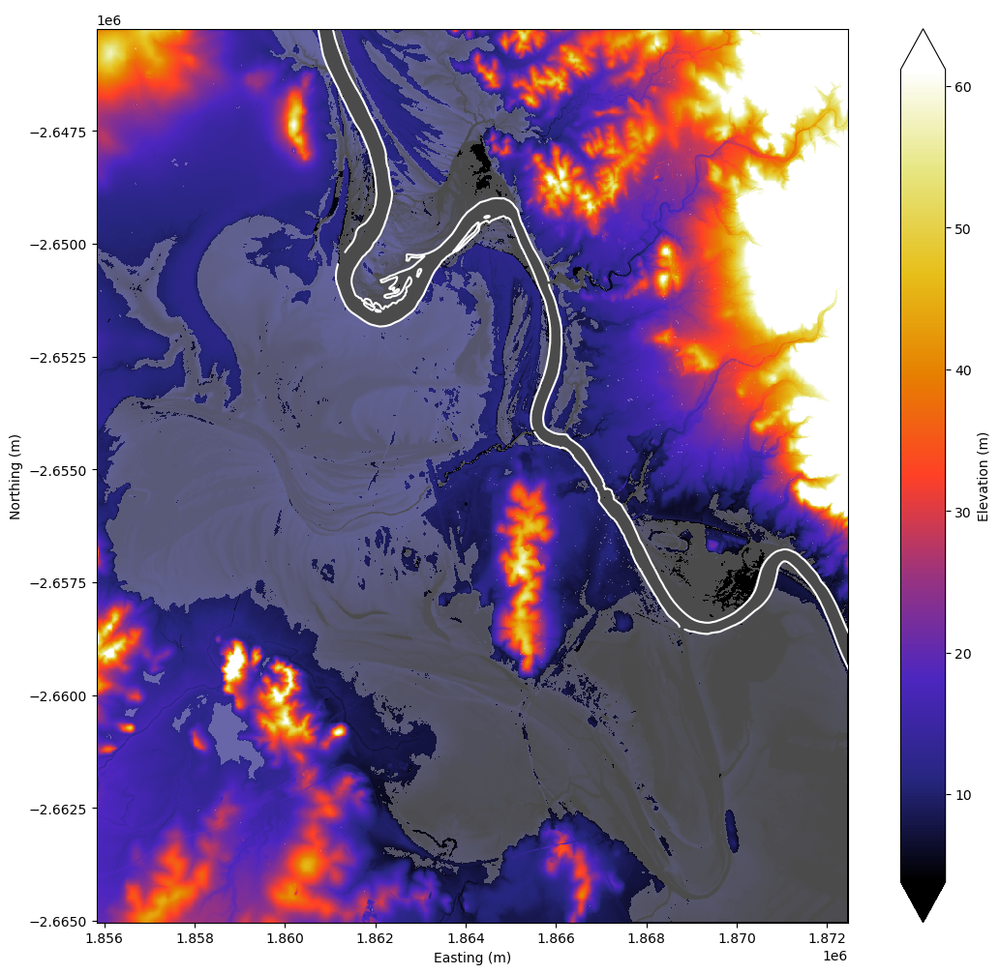

In [82]:
# With River Polyline
# Stretch using 5th and 95th percentiles
vmin = float(dem_2d.quantile(0.05).values)
vmax = float(dem_2d.quantile(0.95).values)

fig, ax = plt.subplots(figsize=(14, 12))

# Plot DEM
dem_2d.plot(
    ax=ax,
    cmap="CMRmap",
    vmin=vmin,
    vmax=vmax,
    cbar_kwargs={"label": "Elevation (m)"}
)

# --- Overlay water mask ---
water_mask_int = water_after_mask.astype(int)
if y[0] < y[-1]:
    water_mask_int = np.flipud(water_mask_int)

water_cmap = mcolors.ListedColormap(['none', 'white'])
ax.imshow(
    water_mask_int,
    extent=(x[0], x[-1], y[0], y[-1]),
    cmap=water_cmap,
    alpha=0.3,
    origin='lower',
    zorder=1  # above raster but below contours
)


# Overlay river polyline
river.plot(ax=ax, color='white', linewidth=1.5)

# Titles and labels
ax.set_title("  ")
ax.set_xlabel("Easting (m)")
ax.set_ylabel("Northing (m)")

plt.show()
output_path = "elevation.png"  # or .pdf, .jpg, etc.
fig.savefig(output_path, dpi=300, bbox_inches='tight')  # dpi=300 for high quality
plt.show()

### Calculate slope and visualise

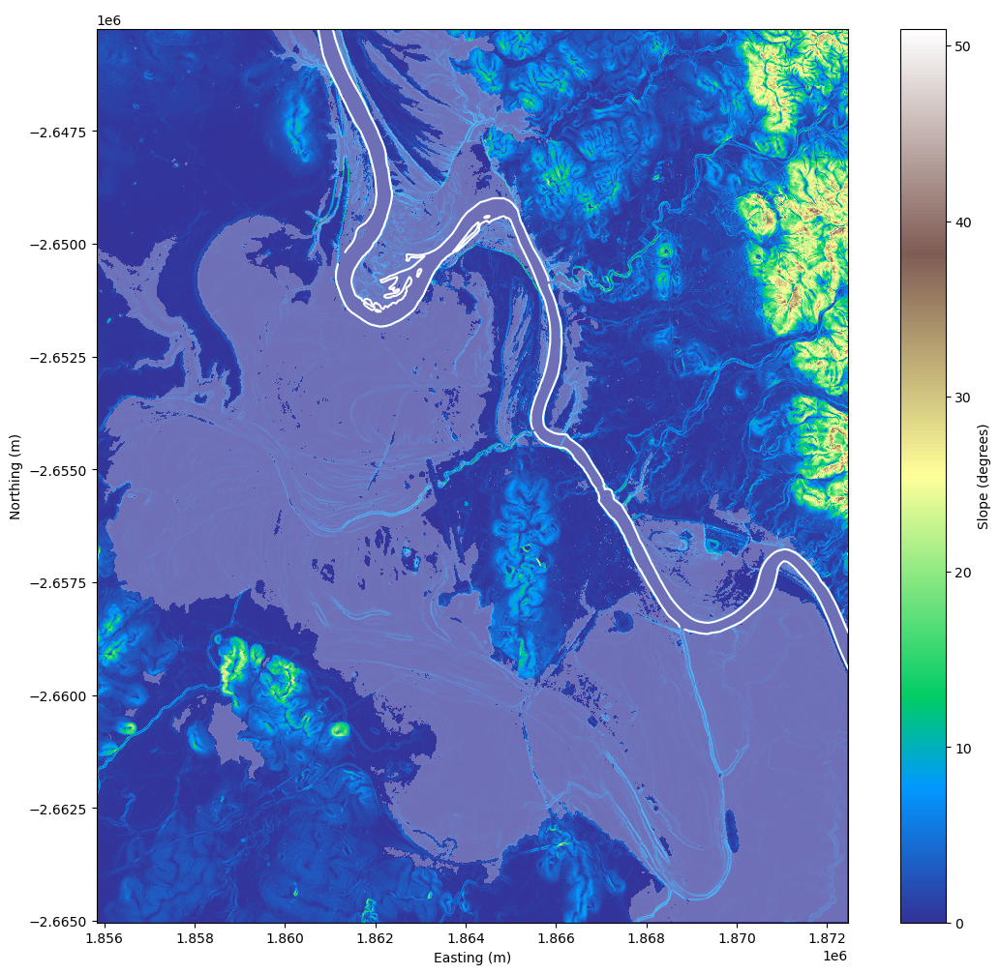

In [93]:
# Ensure 2D DEM as NumPy array
dem = dem_2d.values

# Get pixel size from coordinates
dx = float(np.abs(dem_2d.x[1] - dem_2d.x[0]))  # meters
dy = float(np.abs(dem_2d.y[1] - dem_2d.y[0]))  # meters

# Compute gradients: dz/dx and dz/dy
dz_dy, dz_dx = np.gradient(dem, dy, dx)  # axis0=y, axis1=x

# Compute slope in degrees
slope_deg = np.arctan(np.sqrt(dz_dx**2 + dz_dy**2)) * (180 / np.pi)

# Convert back to xarray for plotting
slope_da = dem_2d.copy()
slope_da.values = slope_deg

# Plot
fig, ax = plt.subplots(figsize=(14, 12))

slope_da.plot(ax=ax, cmap="terrain", cbar_kwargs={"label": "Slope (degrees)"})

# --- Overlay water mask ---
water_mask_int = water_after_mask.astype(int)
if y[0] < y[-1]:
    water_mask_int = np.flipud(water_mask_int)

water_cmap = mcolors.ListedColormap(['none', 'white'])
ax.imshow(
    water_mask_int,
    extent=(x[0], x[-1], y[0], y[-1]),
    cmap=water_cmap,
    alpha=0.3,
    origin='lower',
    zorder=1  # above raster but below contours
)

# Overlay river polyline
river.plot(ax=ax, color='white', linewidth=1.5)
ax.set_aspect(abs(dy/dx))  # match pixel height/width
ax.set_title("  ")
ax.set_xlabel("Easting (m)")
ax.set_ylabel("Northing (m)")
plt.show()

output_path = "slope.png"  # or .pdf, .jpg, etc.
fig.savefig(output_path, dpi=300, bbox_inches='tight')  # dpi=300 for high quality
plt.show()

In [91]:
# add sclae bar
def add_scale_bar(ax, length_km, location=(0.1, 0.05), linewidth=3):
    """
    Adds a scale bar to the map.
    - ax: matplotlib axis
    - length_km: length of the scale bar in km
    - location: fraction of the axes (x0, y0)
    """
    # Convert fraction to data coordinates
    x0 = ax.get_xlim()[0] + location[0]*(ax.get_xlim()[1]-ax.get_xlim()[0])
    y0 = ax.get_ylim()[0] + location[1]*(ax.get_ylim()[1]-ax.get_ylim()[0])
    
    ax.plot([x0, x0+length_km*1000], [y0, y0], color='k', linewidth=linewidth)
    ax.text(x0 + (length_km*500), y0 + (0.01*(ax.get_ylim()[1]-ax.get_ylim()[0])), f'{length_km} km', 
            ha='center', va='bottom', fontsize=12)


# add north arrow
def add_north_arrow(ax, location=(0.9, 0.1), size=0.05):
    """
    Adds a simple north arrow.
    - location: fraction of axes (x0, y0)
    - size: fraction of axes height
    """
    x0 = ax.get_xlim()[0] + location[0]*(ax.get_xlim()[1]-ax.get_xlim()[0])
    y0 = ax.get_ylim()[0] + location[1]*(ax.get_ylim()[1]-ax.get_ylim()[0])
    
    ax.arrow(x0, y0, 0, size*(ax.get_ylim()[1]-ax.get_ylim()[0]), 
             head_width=size*(ax.get_xlim()[1]-ax.get_xlim()[0])/5,
             head_length=size*(ax.get_ylim()[1]-ax.get_ylim()[0])/4, 
             fc='k', ec='k')
    ax.text(x0, y0 + size*(ax.get_ylim()[1]-ax.get_ylim()[0]) + 0.01*(ax.get_ylim()[1]-ax.get_ylim()[0]),
            'N', ha='center', va='bottom', fontsize=14, fontweight='bold')

# After all plotting (raster, contours, water, river)
add_north_arrow(ax, location=(0.9, 0.1), size=0.08)

add_scale_bar(ax, length_km=1)          # 1 km scale bar
add_north_arrow(ax, location=(0.9,0.1))  # north arrow


NameError: name 'add_north_arrow' is not defined

### Calculate Soil Moisture Index

In [43]:
# Calculate SMI and add it to the loaded data set
ds['smi'] = (ds.nbart_nir_1 - ds.nbart_swir_2) / (ds.nbart_nir_1 + ds.nbart_swir_2)

# Check that SMI has been added to dataset
print(ds['smi'])

smi = ds['smi']

<xarray.DataArray 'smi' (time: 2, y: 989, x: 831)> Size: 7MB
dask.array<truediv, shape=(2, 989, 831), dtype=float32, chunksize=(1, 512, 512), chunktype=numpy.ndarray>
Coordinates:
  * time         (time) datetime64[ns] 16B 2017-02-17T00:12:07.463000 2017-04...
  * y            (y) float64 8kB -2.645e+06 -2.645e+06 ... -2.665e+06 -2.665e+06
  * x            (x) float64 7kB 1.856e+06 1.856e+06 ... 1.872e+06 1.872e+06
    spatial_ref  int32 4B 3577


In [53]:
# Select time steps from ds['mndwi']
smi_before = ds['smi'].sel(time="2017-02-17T00:12:07.463000000")
smi_after  = ds['smi'].sel(time="2017-04-08T00:12:11.463000000")

# If using Dask arrays, compute them to get NumPy arrays
smi_before = smi_before.compute()
smi_after  = smi_after.compute()


In [54]:
arr = smi_before.astype('float32')  # if not already float32

# Get coordinates from the original dataset
x = ds.x.values
y = ds.y.values

# Calculate pixel size assuming evenly spaced grid
pixel_width  = x[1] - x[0]
pixel_height = y[0] - y[1]  # y usually decreases

# Create affine transform
transform = from_origin(x.min(), y.max(), pixel_width, abs(pixel_height))

# CRS: EPSG from dataset
crs = f"EPSG:{ds.spatial_ref.values}"

# Write to GeoTIFF
out_path = "smi_before.tif"
with rasterio.open(
    out_path,
    'w',
    driver='GTiff',
    height=arr.shape[0],
    width=arr.shape[1],
    count=1,
    dtype=arr.dtype,
    crs=crs,
    transform=transform,
) as dst:
    dst.write(arr, 1)

print(f"Saved SMI Before Only to {out_path}")


Saved SMI Before Only to smi_before.tif


/tmp/ipykernel_105/169484279.py:7: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  width = ds.dims["x"]
/tmp/ipykernel_105/169484279.py:8: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  height = ds.dims["y"]


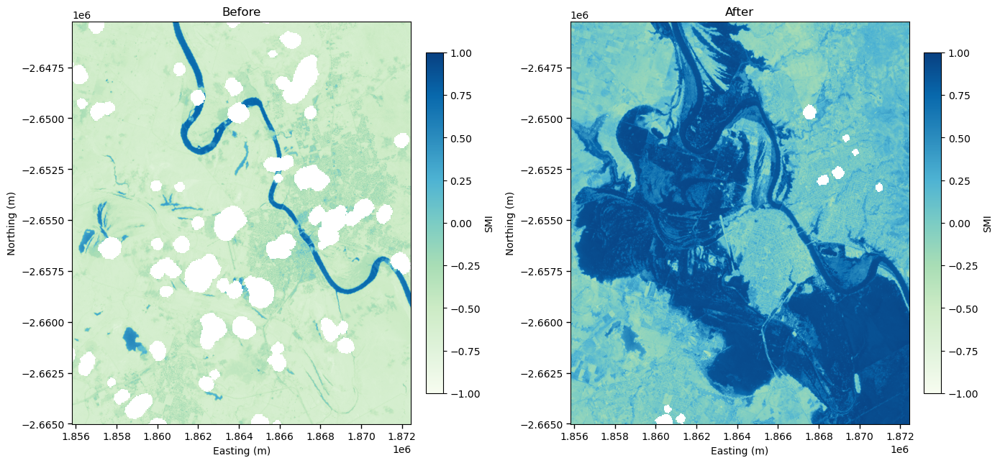

In [49]:
# Visualise SMI

import matplotlib.pyplot as plt

# --- Get spatial extent from dataset ---
transform = ds.odc.transform
width = ds.dims["x"]
height = ds.dims["y"]

x_min = transform.c
y_max = transform.f
x_max = x_min + transform.a * width
y_min = y_max + transform.e * height  # transform.e is negative

extent = [x_min, x_max, y_min, y_max]

# Select before and after dates
before_date_ds = ds.isel(time=0)
after_date_ds  = ds.isel(time=-1)

# Plot side by side
fig, axes = plt.subplots(1, 2, figsize=(14, 12))

# --- Before Date MNDWI ---
im1 = axes[0].imshow(
    before_date_ds['mndwi'],
    cmap='GnBu',
    vmin=-1, vmax=1,
    origin='upper',
    extent=extent
)
axes[0].set_title("Before")
axes[0].set_xlabel("Easting (m)")
axes[0].set_ylabel("Northing (m)")
axes[0].tick_params(direction='out', length=4, width=1)

cbar1 = fig.colorbar(im1, ax=axes[0], fraction=0.046, pad=0.04)
cbar1.set_label("SMI")

# --- After Date MNDWI ---
im2 = axes[1].imshow(
    after_date_ds['smi'],
    cmap='GnBu',
    vmin=-1, vmax=1,
    origin='upper',
    extent=extent
)
axes[1].set_title("After")
axes[1].set_xlabel("Easting (m)")
axes[1].set_ylabel("Northing (m)")
axes[1].tick_params(direction='out', length=4, width=1)

cbar2 = fig.colorbar(im2, ax=axes[1], fraction=0.046, pad=0.04)
cbar2.set_label("SMI")

plt.tight_layout()


output_path = "msi.png"  # or .pdf, .jpg, etc.
fig.savefig(output_path, dpi=300, bbox_inches='tight')  # dpi=300 for high quality
plt.show()

## Check data for Distance From River, DEM & Slope

In [34]:
print("----- Distance From River -----")
print(f"Shape: {distance_from_river.shape}")
print(f"Min distance (m): {np.min(distance_from_river):.2f}")
print(f"Max distance (m): {np.max(distance_from_river):.2f}")
print(f"Mean distance (m): {np.mean(distance_from_river):.2f}")
print(f"Median distance (m): {np.median(distance_from_river):.2f}")
print(f"Number of NaNs: {np.isnan(distance_from_river).sum()}\n")  # \n adds an empty line

print("----- Elevation -----")
print(f"Shape: {dem_2d.shape}")
print(f"Min elevation (m): {float(dem_2d.min()):.2f}")
print(f"Max elevation (m): {float(dem_2d.max()):.2f}")
print(f"Mean elevation (m): {float(dem_2d.mean()):.2f}")
print(f"Median elevation (m): {float(dem_2d.median()):.2f}")
print(f"Number of NaNs: {np.isnan(dem_2d.values).sum()}\n")

print("----- Slope -----")
print(f"Shape: {slope_deg.shape}")
print(f"Min slope (deg): {np.min(slope_deg):.2f}")
print(f"Max slope (deg): {np.max(slope_deg):.2f}")
print(f"Mean slope (deg): {np.mean(slope_deg):.2f}")
print(f"Median slope (deg): {np.median(slope_deg):.2f}")
print(f"Number of NaNs: {np.isnan(slope_deg).sum()}")


# # Looped version for future use & learning:
# # Put your variables into a dictionary
# rasters = {
#     "Distance From River": distance_from_river,
#     "Elevation": dem_2d.values,   # convert xarray to NumPy
#     "Slope": slope_deg
# }

# # Loop over each raster
# for name, arr in rasters.items():
#     print(f"----- {name} -----")
#     print(f"Shape: {arr.shape}")
#     print(f"Min: {np.nanmin(arr):.2f}")
#     print(f"Max: {np.nanmax(arr):.2f}")
#     print(f"Mean: {np.nanmean(arr):.2f}")
#     print(f"Number of NaNs: {np.isnan(arr).sum()}\n")  # blank line for spacing


----- Distance From River -----
Shape: (989, 831)
Min distance (m): 0.00
Max distance (m): 14303.15
Mean distance (m): 3928.37
Median distance (m): 3429.40
Number of NaNs: 0

----- Elevation -----
Shape: (990, 832)
Min elevation (m): -1.34
Max elevation (m): 403.74
Mean elevation (m): 19.54
Median elevation (m): 9.91
Number of NaNs: 0

----- Slope -----
Shape: (990, 832)
Min slope (deg): 0.00
Max slope (deg): 50.97
Mean slope (deg): 2.25
Median slope (deg): 0.67
Number of NaNs: 0


### Resample to match shape for all

In [140]:
import xarray as xr

import xarray as xr
import numpy as np

# Convert DEM and slope to xarray
dem_da = xr.DataArray(dem_2d, dims=("y", "x"))
slope_da = xr.DataArray(slope_deg, dims=("y", "x"))

# Create target coordinates based on flood raster shape
target_y = np.arange(water_after_mask.shape[0])
target_x = np.arange(water_after_mask.shape[1])

# Interpolate DEM and slope to match flood raster
dem_resampled = dem_da.interp(x=target_x, y=target_y, method="linear").values
slope_resampled = slope_da.interp(x=target_x, y=target_y, method="linear").values

# Check shapes
print("DEM resampled:", dem_resampled.shape)
print("Slope resampled:", slope_resampled.shape)
print("Flood raster:", water_after_mask.shape)
print("Distance raster:", distance_from_river.shape)

print("MNDWI shape:", mndwi_after.shape)

DEM resampled: (989, 831)
Slope resampled: (989, 831)
Flood raster: (989, 831)
Distance raster: (989, 831)
MNDWI shape: (989, 831)


In [141]:
# export as tiffs to avoid memory issues
import rasterio

# Open reference raster
with rasterio.open("mndwi_after.tif") as ref:
    transform = ref.transform
    crs = ref.crs
    height = ref.height
    width = ref.width

# Dictionary of raster arrays and filenames
rasters_to_save = {
    "DEM.tif": dem_resampled,
    "Slope.tif": slope_resampled,
    "Flood.tif": water_after_mask,
    "DistanceToRiver.tif": distance_from_river
}

for fname, array in rasters_to_save.items():
    # Ensure array shape matches reference raster
    if array.shape != (height, width):
        raise ValueError(f"Shape mismatch for {fname}: {array.shape} vs reference {(height, width)}")
    
    # Convert binary flood map to uint8 if needed
    if fname == "Flood.tif":
        array = array.astype('uint8')
    
    # Determine dtype
    dtype = array.dtype

    # Write GeoTIFF
    with rasterio.open(
        fname,
        'w',
        driver='GTiff',
        height=height,
        width=width,
        count=1,
        dtype=dtype,
        crs=crs,
        transform=transform
    ) as dst:
        dst.write(array, 1)
    
    print(f"Saved {fname} with shape {array.shape} and dtype {dtype}")



Saved DEM.tif with shape (989, 831) and dtype float64
Saved Slope.tif with shape (989, 831) and dtype float64
Saved Flood.tif with shape (989, 831) and dtype uint8
Saved DistanceToRiver.tif with shape (989, 831) and dtype float64


In [143]:
# just export DEM bc it didnt work before
import rasterio
import numpy as np

# Slice DEM to new shape
dem_cropped = dem_2d[:989, :831]  # keep first 989 rows and 831 columns

# Open reference raster for spatial metadata
with rasterio.open("mndwi_after.tif") as ref:
    transform = ref.transform
    crs = ref.crs
    height = ref.height
    width = ref.width

# Check that the new shape matches desired size
print("Cropped DEM shape:", dem_cropped.shape)  # should be (989, 831)

# Export cropped DEM
with rasterio.open(
    "DEM.tif",
    'w',
    driver='GTiff',
    height=dem_cropped.shape[0],
    width=dem_cropped.shape[1],
    count=1,
    dtype=dem_cropped.dtype,
    crs=crs,
    transform=transform,
    nodata=None
) as dst:
    dst.write(dem_cropped, 1)

print("DEM.tif exported successfully!")


Cropped DEM shape: (989, 831)
DEM.tif exported successfully!
